<a href="https://colab.research.google.com/github/NisaMercan/DSP_Project/blob/main/BC_FNM_SG_weather_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [195]:
## Extract the WAV files
!unzip /content/drive/MyDrive/dataset.zip

Archive:  /content/drive/MyDrive/dataset.zip
replace dataset/001-wind/001_wind_01.wav? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: dataset/001-wind/001_wind_01.wav  
  inflating: dataset/001-wind/001_wind_010.wav  
  inflating: dataset/001-wind/001_wind_02.wav  
  inflating: dataset/001-wind/001_wind_03.wav  
  inflating: dataset/001-wind/001_wind_04.wav  
  inflating: dataset/001-wind/001_wind_06.wav  
  inflating: dataset/001-wind/001_wind_07.wav  
  inflating: dataset/001-wind/001_wind_08.wav  
  inflating: dataset/001-wind/001_wind_test_diff_01.wav  
  inflating: dataset/001-wind/001_wind_test_plot_01.wav  
  inflating: dataset/002-rain/002_rain_01.wav  
  inflating: dataset/002-rain/002_rain_010.wav  
  inflating: dataset/002-rain/002_rain_02.wav  
  inflating: dataset/002-rain/002_rain_03.wav  
  inflating: dataset/002-rain/002_rain_05.wav  
  inflating: dataset/002-rain/002_rain_06.wav  
  inflating: dataset/002-rain/002_rain_07.wav  
  inflating: dataset/002-rain/002_r

In [196]:
#################### Audio Preprocessing ####################

In [197]:
import numpy as np 
import matplotlib.pyplot as plt 
import scipy.signal as sgnl
from scipy.fftpack import fft, ifft
import scipy.io
from scipy.io.wavfile import read     # to open and return Fs of the WAV file
from IPython.lib.display import Audio # to create audio files 
#%matplotlib notebook
%matplotlib inline

In [198]:
#from google.colab import drive
#drive.mount('/content/drive')

In [199]:
## Reading Files
def readAudio(s, ad):
    Fs, x = read(s)
    xn = x[:,1]
    print(f'{ad} shape: ', x.shape)
    print(f'{ad} sampling frequency: ', Fs)
    
    return Fs, xn

In [200]:
## Plotting Signals
def plotAudio(xn, ad, i):
    N = len(xn)
    n = np.arange(0,N)
    
    plt.subplots(figsize=(4, 4))
    plt.tight_layout()
    
    plt.plot(n,xn)
    plt.xlabel(f'n (sample)')
    plt.title(f'{ad} Isareti')
    plt.show()

In [201]:
## Amplitude and Phase
def FTAudio_abs(N, xn, ad):
    w = np.arange(-np.pi,np.pi,2*np.pi/N)
    xw = np.fft.fftshift(np.fft.fft(xn,N)/N)

    plt.subplots(figsize=(4, 4))
    plt.plot(w/np.pi,abs(xw)) 
    plt.xlabel('$\omega / \pi$')
    plt.ylabel(f'$|{ad}(\omega)|$')    
    plt.title(f'{ad} Isareti Genligi')
    plt.show()
    
    return xw

def FTAudio_pha(N, xn, ad):
    w = np.arange(-np.pi,np.pi,2*np.pi/N)
    xw = np.fft.fftshift(np.fft.fft(xn,N)/N)

    plt.subplots(figsize=(4, 4))
    plt.plot(w/np.pi,np.angle(xw)) 
    plt.xlabel('$\omega / \pi$')
    plt.ylabel(f'$|{ad}(\omega)|$')    
    plt.title(f'{ad} Isareti Fazi')
    plt.show()

In [202]:
Fs_ygm, ygm = readAudio("/content/dataset/002-rain/002_rain_test_plot_01.wav", "Rain4")
Fs_rzg, rzg = readAudio("/content/dataset/001-wind/001_wind_test_plot_01.wav", "Ruzgar")
Fs_gns, gns = readAudio("/content/dataset/003-sunny/003_sunny_test_diff_01.wav", "Gunesli")
Fs_dol, dol = readAudio("/content/dataset/004-hail/004_hail_test_plot_01.wav", "Dolu")

Rain4 shape:  (2822400, 2)
Rain4 sampling frequency:  44100
Ruzgar shape:  (482047, 2)
Ruzgar sampling frequency:  48000
Gunesli shape:  (1146880, 2)
Gunesli sampling frequency:  44100
Dolu shape:  (749700, 2)
Dolu sampling frequency:  44100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: WavFileWarning: Chunk (non-data) not understood, skipping it.
  This is separate from the ipykernel package so we can avoid doing imports until


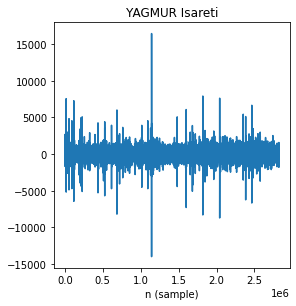

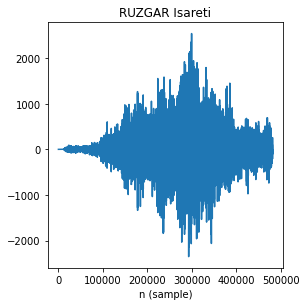

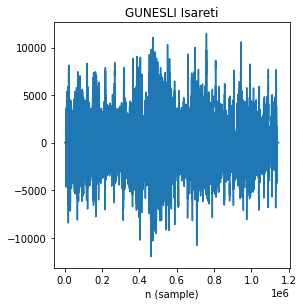

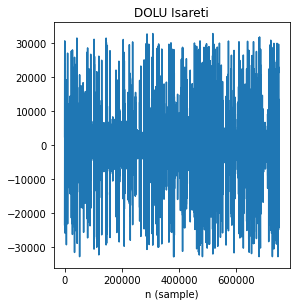

In [203]:
plotAudio(ygm, "YAGMUR", 1)
plotAudio(rzg, "RUZGAR", 2)
plotAudio(gns, "GUNESLI", 3)
plotAudio(dol, "DOLU", 4)

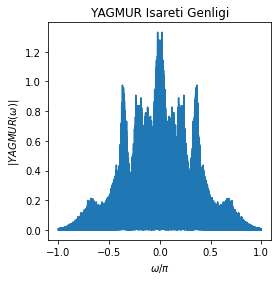

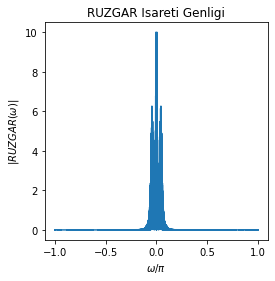

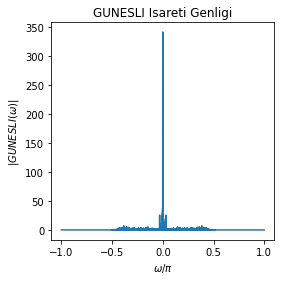

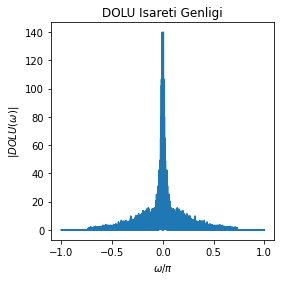

In [204]:
ygmw = FTAudio_abs(len(ygm), ygm, "YAGMUR")
rzgw = FTAudio_abs(len(rzg), rzg,"RUZGAR")
gnsw = FTAudio_abs(len(gns), gns,"GUNESLI")
dolw = FTAudio_abs(len(dol), dol,"DOLU")

In [205]:
## Audio Display
print('YAGMUR işareti için:')
display(Audio(ygm, rate=Fs_ygm))

print('RUZGAR işareti için:')
display(Audio(rzg, rate=Fs_rzg))

print('GUNESLI işareti için:')
display(Audio(gns, rate=Fs_gns))

print('DOLU işareti için:')
display(Audio(dol, rate=Fs_dol))

YAGMUR işareti için:


RUZGAR işareti için:


GUNESLI işareti için:


DOLU işareti için:


In [207]:
#################### Feature Extraction ####################

In [208]:
## Required Libraries and Packages
!pip install librosa
!pip install sounddevice  # for play and record np.arrays
!sudo apt-get install libportaudio2   # portable audio I/O library

from matplotlib.pyplot import specgram # to plot a spectrogram

import soundfile as sf                # to read and write files
import sounddevice as sd              # for play and record np.arrays
import librosa                        # for music and sound analysis
import librosa.display                # for plotting the amplitude
import sklearn                        # for SVM
from sklearn.preprocessing import Normalizer # to normalize samples to unit norm 
from os.path import dirname, join as pjoin # for functions on multiple pathnames  
from scipy.io import wavfile

import code
import glob  
import os    # to interact with OS
import queue # to operate like a stack
from tqdm.notebook import tqdm # to show a progress meter bar

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libportaudio2 is already the newest version (19.6.0-1).
0 upgraded, 0 newly installed, 0 to remove and 37 not upgraded.


In [209]:
## Feature Extraction 
# path_to_dataset: takes one parameter that shows the path
def features_to_numpy(path_to_dataset): 
  labels = [] # wind or rain or sunny
  features = np.empty((0,193)) # 0 to 193 dimensions
  print("Starting walking in the directory of dataset for feature extraction...")
  for root, dirs, files in tqdm(os.walk(path_to_dataset)): # all dataset files
      for file in tqdm(files): # progress bar
          if file.endswith(".wav"): # file extension
             file_name=os.path.join(root, file) # concatenates path components
             
             X, sample_rate = sf.read(file_name, dtype='float32') # read file
             
             # convert X array to vector 
             if X.ndim > 1: X = X[:,0]
             X = X.T
             
             ## Short Time FT: 
             # represents the signal in the freq domain by using DFT and
             # extract frequencies of harmonics in the audio signal
             stft = np.abs(librosa.stft(X)) 
             
             ## Mel Frequency Cepstral Coefficients
             # y : audio time series
             # sr: sample rate of y
             # n_mffc: number of MFCCs to return
             mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T,axis=0)
             
             # Mel Scaled Spectrogram
             # computes a mel-scaled spectrogram from audio series
             mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)

             ## Spectral Contrast
             # considers the spectral peak and their difference in each
             # frequency subband and computes the spectral contrast
             contrast = np.mean(librosa.feature.spectral_contrast(S=stft, sr=sample_rate).T,axis=0)
             
             ## Tonnetz
             # contains harmonic content of the audio signal
             # extracts the harmonic elements from the audio 
             tonnetz = np.mean(librosa.feature.tonnetz(y=librosa.effects.harmonic(X), sr=sample_rate).T,axis=0)
             
             ## Chromatagram
             # computes a chromagram
             # chromagram is a transformation of a signal's time-frequency
             # into a temporally varying pitch
             chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)


             # stack the algorithm arrays into one single array both horizontally and vertically 
             ext_features = np.hstack([mfccs,chroma,mel,contrast,tonnetz]) 
             features = np.vstack([features,ext_features])
          
             # label the sounds
             if os.path.basename(os.path.dirname(file_name)) == "001-wind":
               labels.append(1) # wind sounds - 1
             elif os.path.basename(os.path.dirname(file_name)) == "003-sunny":
               labels.append(3) # sunny sounds - 3
             elif os.path.basename(os.path.dirname(file_name)) == "004-hail":
               labels.append(4) # hail sounds - 4
             else:
                labels.append(2) # rain sounds - 2
               
  labels = np.array(labels) 
  np.save('features.npy', features) # saves the array into bin file as .npy 
  np.save('label.npy', labels) # saves the array into bin file as .npy


In [210]:
features_to_numpy("/content/dataset")

Starting walking in the directory of dataset for feature extraction...


0it [00:00, ?it/s]

0it [00:00, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

In [211]:
#################### SVM Model and Grid Search ####################

In [212]:
import sklearn               # for machine learning and statistical modeling including classification
from sklearn.svm import SVC  # support vector machine
from sklearn.model_selection import train_test_split # to split the matrices into train and subset
from sklearn.model_selection import GridSearchCV     # to help to loop through predefined hyperparameters and model the training set
from sklearn.metrics import classification_report    # to build a text report that contains the main classifications
from sklearn.model_selection import GridSearchCV     # grid search

# Load data from numpy file
X =  np.load('features.npy')
y =  np.load('label.npy').ravel()

#len(X)

# Split data into training and test subsets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)


model = SVC() 
model.fit(X_train, y_train)
  
# print the prediction results before grid search and hyperparameters
predictions = model.predict(X_test)
print(classification_report(y_test, predictions))


  
# parameter grid definition which will be used by GridSearchCV
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']} 
  
grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3)

# 2 loops for fitting (with and without cross validation)
grid.fit(X_train, y_train)

# after tuning
print(grid.best_params_)
# after hyper-parameter tuning
print(grid.best_estimator_)  

              precision    recall  f1-score   support

           1       1.00      0.50      0.67         2
           2       1.00      0.67      0.80         3
           3       0.33      1.00      0.50         1
           4       1.00      1.00      1.00         3

    accuracy                           0.78         9
   macro avg       0.83      0.79      0.74         9
weighted avg       0.93      0.78      0.80         9

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.286 total time=   0.0s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.286 total time=   0.0s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.333 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.333 total time=   0.0s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.167 total time=   0.0s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.286 total time=   0.0s
[CV 2/5] END ....

In [213]:
# we will use the parameters after best-tuning
model = SVC(C=1, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.0001, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)
model.fit(X_train, y_train)

SVC(C=1, gamma=0.0001)

In [214]:
# print prediction results
#predictions = model.predict(X_test)
#print(classification_report(y_test, predictions))

In [215]:
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

In [216]:
#################### Audio Classification ####################

In [217]:
def differentiate(path_to_wav):
  X, sample_rate = sf.read(path_to_wav, dtype='float32')
  features, labels = np.empty((0,193)), np.empty(0)
  X = X[1:len(X),0 ]
  
  stft = np.abs(librosa.stft(X))
  db = librosa.amplitude_to_db(stft,ref=np.max)
  mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T,axis=0)
  mel = np.mean(librosa.feature.melspectrogram(X, sr=sample_rate).T,axis=0)
  contrast = np.mean(librosa.feature.spectral_contrast(S=stft, sr=sample_rate).T,axis=0)
  tonnetz = np.mean(librosa.feature.tonnetz(y=librosa.effects.harmonic(X), sr=sample_rate).T,axis=0)
  chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)

  plt.subplots(figsize=(7, 10))  
# STFT
  plt.subplot(3,2,1)
  librosa.display.specshow(db, sr=sample_rate, y_axis='log', x_axis='time')
  #plt.plot(stft)
  plt.title('Short Time FT')

  plt.subplot(3,2,2)
  librosa.display.specshow(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40)) 
  plt.colorbar()
  plt.tight_layout()
  plt.plot(mfccs)
  plt.title('Mel Frequency Cepstral Coefficients')

  plt.subplot(3,2,3)
  #plt.plot(mel)
  S = librosa.feature.melspectrogram(X, sr=sample_rate)
  S_DB = librosa.power_to_db(S, ref=np.max)
  librosa.display.specshow(S_DB, sr=sample_rate, x_axis='time', y_axis='mel');
  plt.colorbar(format='%+2.0f dB');
  plt.title('MEL')

  plt.subplot(3,2,4)
  #plt.plot(contrast)
  plt.imshow(normalize(librosa.feature.spectral_contrast(S=stft, sr=sample_rate), axis=1), aspect='auto', origin='lower', cmap='coolwarm')
  plt.title('Spectral Contrast')

  plt.subplot(3,2,5)
  #plt.plot(tonnetz)
  plt.imshow(normalize(librosa.feature.tonnetz(y=librosa.effects.harmonic(X), sr=sample_rate), axis=1), aspect='auto', origin='lower', cmap='coolwarm')
  plt.title('Tonnetz')

  plt.subplot(3,2,6)
  #plt.plot(chroma)
  plt.imshow(normalize(librosa.feature.chroma_stft(S=stft, sr=sample_rate)), aspect='auto', origin='lower', cmap='coolwarm')
  plt.title('Chromagram')

  ext_features = np.hstack([mfccs,chroma,mel,contrast,tonnetz])
  features = np.vstack([features,ext_features])
  deneme_test = np.array(features)
  if model.predict(deneme_test) == 1:
    print("this is a wind sound")
  elif model.predict(deneme_test) == 3:
    print("this is a sunny sound")
  elif model.predict(deneme_test) == 2:
    print("this is a rain sound")
  elif model.predict(deneme_test) == 4:
    print("this is a hail sound")

this is a wind sound


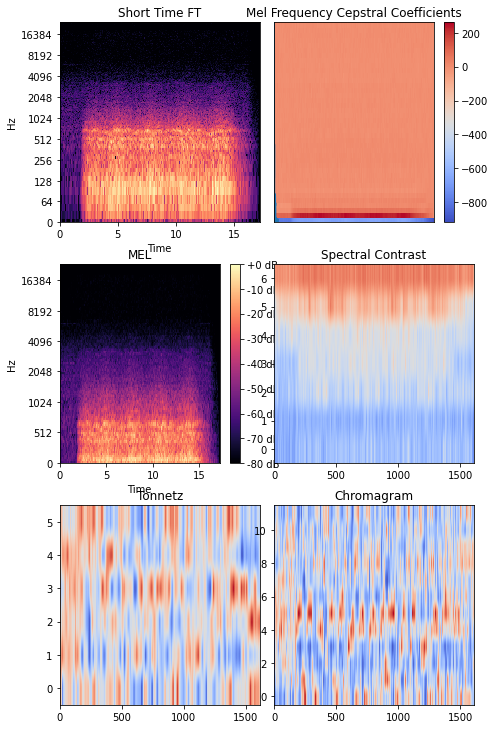

In [218]:
differentiate("/content/001_wind_test_diff_01.wav")

this is a rain sound


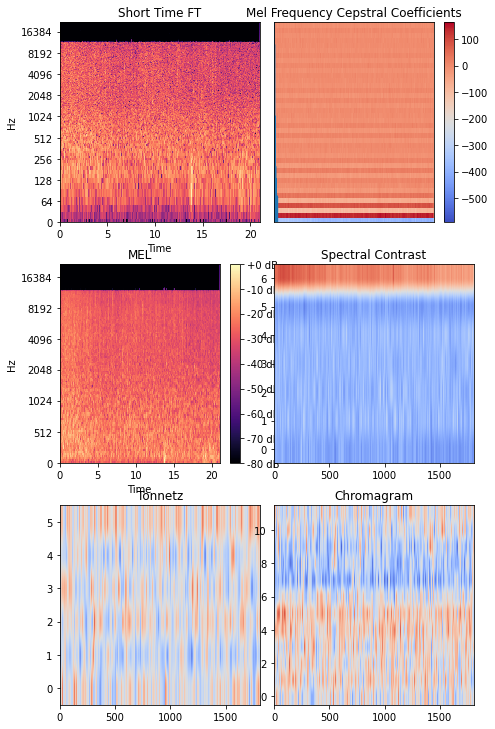

In [219]:
differentiate("/content/002_rain_test_diff_01.wav")

this is a sunny sound


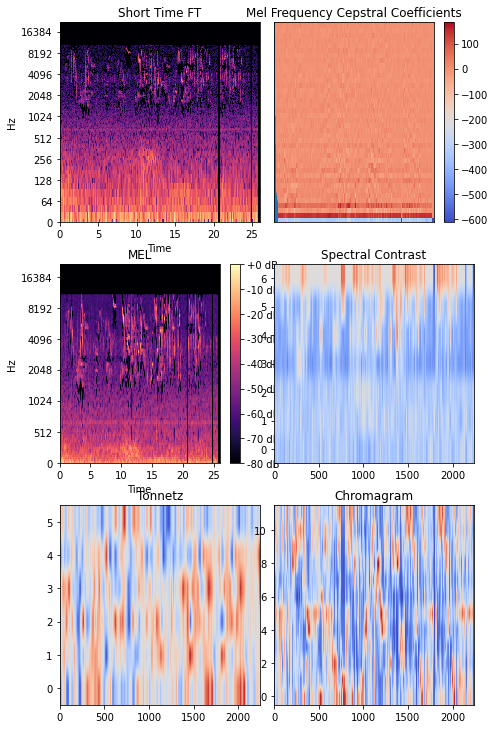

In [220]:
differentiate("/content/003_sunny_test_diff_01.wav")

this is a hail sound


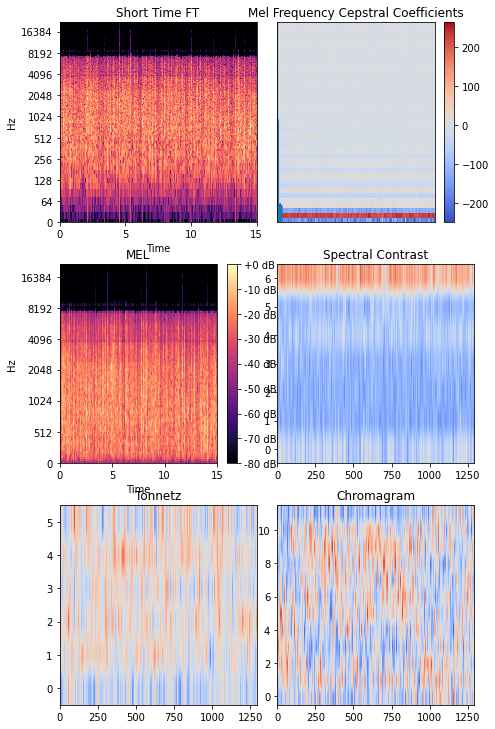

In [221]:
differentiate("/content/004_hail_test_diff_01.wav")

this is a wind sound


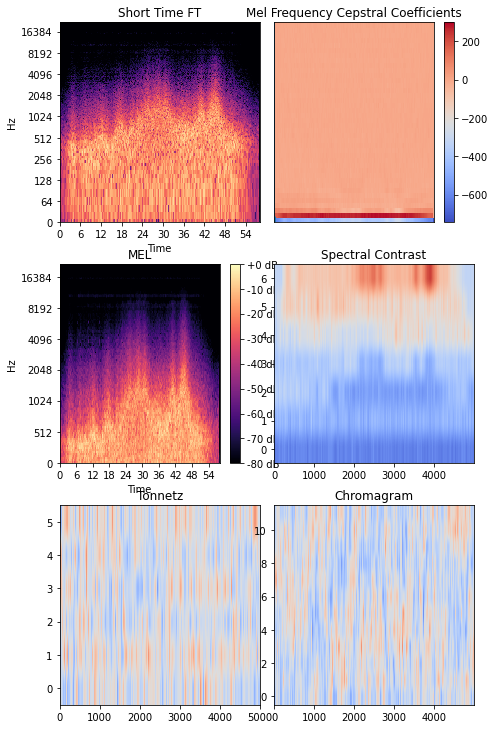

In [222]:
differentiate("/content/001_wind_test_rand_01.wav")

this is a rain sound


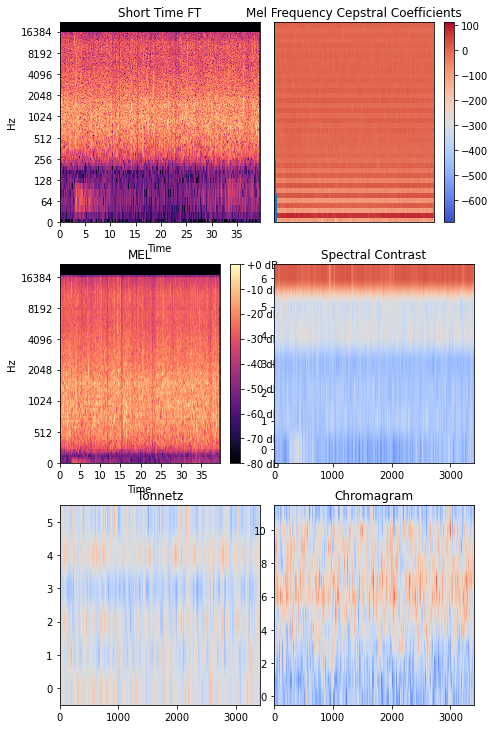

In [223]:
differentiate("/content/002_rain_test_rand_01.wav")

this is a sunny sound


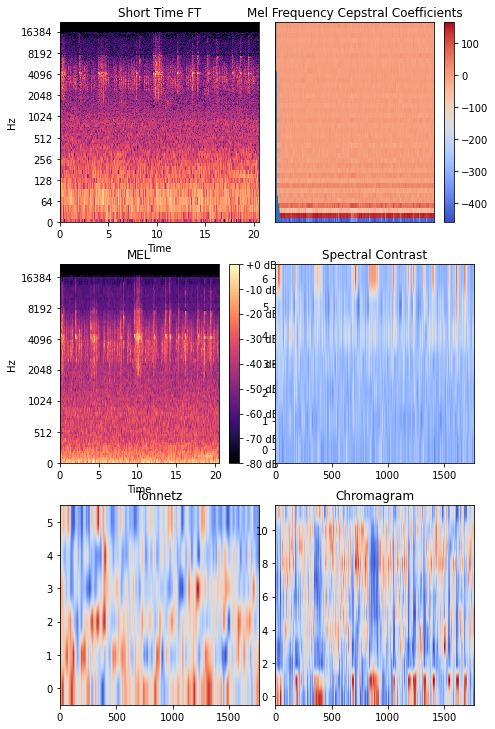

In [224]:
differentiate("/content/003_sunny_test_rand_01.wav")

this is a hail sound


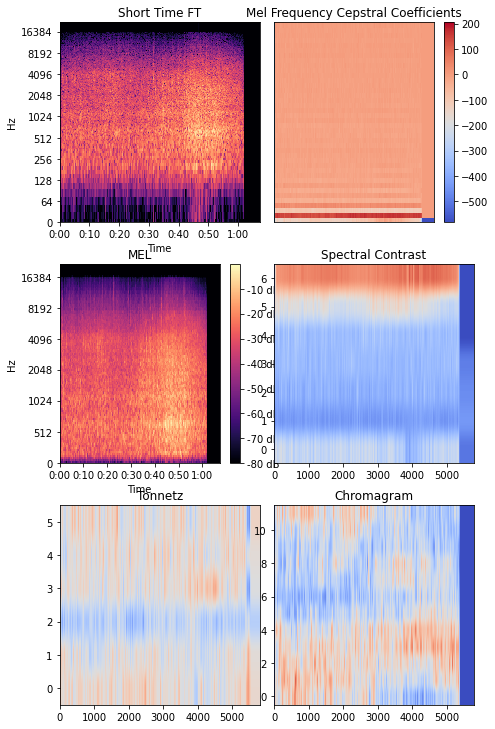

In [225]:
differentiate("/content/004_hail_test_rand_01.wav")

In [226]:
import joblib
filename = 'BC_FNM_SG_weather_classifier.sav'
joblib.dump(model, filename) # object to a file

['BC_FNM_SG_weather_classifier.sav']